# City of Boston - Property Assessment Data 2023

## Data Cleaning, Wrangling, Visualization, Exploratory Analysis

(Data Source: https://data.boston.gov/dataset/property-assessment)


### Features of focus in this analysis:

* Parcel ID (PID)
* Zip code (ZIP_CODE)
* Year built (YR_BUILT)
* Land use (LU)
* Gross area (GROSS_AREA)
* Year built (YR_BUILT)
* Land value (LAND_VALUE)
* Structural classification of buildings (STRUCTURE_CLASS)
* Property owner (OWNER)

## Load data, libraries

In [ ]:
# Import libraries

import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import json
import geopandas as gpd
import warnings

In [ ]:
# Column datatypes

datatypes = {
    'PID': 'object',
    'CM_ID': 'object',
    'GIS_ID': 'object',
    'ST_NUM': 'object',
    'UNIT_NUM': 'object',
    'CITY': 'object',
    'ZIP_CODE': 'object',
    'BLDG_SEQ': 'object',
    'NUM_BLDGS': 'float64',
    'LUC': 'object',
    'LU': 'object',
    'LU_DESC': 'object',
    'BLDG_TYPE': 'object',
    'OWN_OCC': 'object',
    'OWNER': 'object',
    'OWNER MAIL ADDRESS': 'object',
    'RES_FLOOR': 'float64',
    'CD_FLOOR': 'float64',
    'RES_UNITS': 'float64',
    'COM_UNITS': 'float64',
    'RC_UNITS': 'float64',
    'LAND_SF': 'float64',
    'GROSS_AREA': 'float64',
    'LIVING_AREA': 'float64',
    'LAND_VALUE': 'float64',
    'BLDG_VALUE': 'float64',
    'TOTAL_VALUE': 'float64',
    'GROSS_TAX': 'float64',
    'YR_BUILT': 'Int64',
    'YR_REMODEL': 'Int64',
    'STRUCTURE_CLASS': 'object',
    'ROOF_STRUCTURE': 'object',
    'ROOF_COVER': 'object',
    'INT_WALL': 'object',
    'EXT_FNISHED': 'object',
    'INT_COND': 'object',
    'EXT_COND': 'object',
    'OVERALL_COND': 'object',
    'BED_RMS': 'float64',
    'FULL_BTH': 'float64',
    'HLF_BTH': 'float64',
    'KITCHENS': 'float64',
    'TT_RMS': 'float64',
    'BDRM_COND': 'object',
    'BTHRM_STYLE1': 'object',
    'BTHRM_STYLE2': 'object',
    'BTHRM_STYLE3': 'object',
    'KITCHEN_TYPE': 'object',
    'KITCHEN_STYLE1': 'object',
    'KITCHEN_STYLE2': 'object',
    'KITCHEN_STYLE3': 'object',
    'HEAT_TYPE': 'object',
    'HEAT_FUEL': 'object',
    'AC_TYPE': 'object',
    'FIREPLACES': 'float64',
    'float64': 'object',
    'ORIENTATION': 'object',
    'NUM_PARKING': 'float64',
    'PROP_VIEW': 'object',
    'CORNER_UNIT': 'object'}

In [ ]:
# File path
dataPath = '<path_to_file - fy2023-property-assessment-data.csv>'

# Load data
df1 = pd.read_csv(
    filepath_or_buffer = dataPath,
    header = 0,
    dtype = datatypes)

In [ ]:
# Dataframe dimensions
df1.shape

(180627, 60)

In [ ]:
# Printing option
pd.set_option('display.max_columns', None)

# Top 5 rows
df1.head()

,PID,CM_ID,GIS_ID,ST_NUM,ST_NAME,UNIT_NUM,CITY,ZIP_CODE,BLDG_SEQ,NUM_BLDGS,LUC,LU,LU_DESC,BLDG_TYPE,OWN_OCC,OWNER,OWNER MAIL ADDRESS,RES_FLOOR,CD_FLOOR,RES_UNITS,COM_UNITS,RC_UNITS,LAND_SF,GROSS_AREA,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YR_BUILT,YR_REMODEL,STRUCTURE_CLASS,ROOF_STRUCTURE,ROOF_COVER,INT_WALL,EXT_FNISHED,INT_COND,EXT_COND,OVERALL_COND,BED_RMS,FULL_BTH,HLF_BTH,KITCHENS,TT_RMS,BDRM_COND,BTHRM_STYLE1,BTHRM_STYLE2,BTHRM_STYLE3,KITCHEN_TYPE,KITCHEN_STYLE1,KITCHEN_STYLE2,KITCHEN_STYLE3,HEAT_TYPE,HEAT_FUEL,AC_TYPE,FIREPLACES,ORIENTATION,NUM_PARKING,PROP_VIEW,CORNER_UNIT
0,0100001000,NaN,0100001000,104,PUTNAM ST,NaN,EAST BOSTON,02128,1,1.0,105,R3,THREE-FAM DWELLING,RE - Row End,Y,PASCUCCI CARLO,"195 LEXINGTON ST, EAST BOSTON, MA 02128",3.0,NaN,NaN,NaN,NaN,1150.0,3353.0,2202.0,195700.0,588500.0,784200.0,8422.3072,1900,<NA>,NaN,F - Flat,C - Composition,N - Normal,A - Asbestos,A - Average,F - Fair,A - Average,6.0,3.0,0.0,3.0,12.0,NaN,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,3F - 3 Full Eat In Kitchens,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,W - Ht Water/Steam,NaN,N - None,0.0,NaN,3.0,A - Average,NaN
1,0100002000,NaN,0100002000,197,Lexington ST,NaN,EAST BOSTON,02128,1,1.0,105,R3,THREE-FAM DWELLING,RM - Row Middle,Y,SEMBRANO RODERICK,"197 LEXINGTON ST, EAST BOSTON, MA 02128",3.0,NaN,NaN,NaN,NaN,1150.0,3299.0,2307.0,196500.0,615300.0,811800.0,8718.7272,1920,2000,NaN,F - Flat,C - Composition,N - Normal,M - Vinyl,A - Average,A - Average,A - Average,3.0,3.0,0.0,3.0,9.0,NaN,M - Modern,M - Modern,M - Modern,3F - 3 Full Eat In Kitchens,M - Modern,M - Modern,M - Modern,F - Forced Hot Air,NaN,C - Central AC,0.0,NaN,0.0,A - Average,NaN
2,0100003000,NaN,0100003000,199,Lexington ST,NaN,EAST BOSTON,02128,1,1.0,105,R3,THREE-FAM DWELLING,RM - Row Middle,N,GUERRA CHEVARRIA ANA S,"199 LEXINGTON ST, EAST BOSTON, MA 02128",3.0,NaN,NaN,NaN,NaN,1150.0,3392.0,2268.0,197100.0,599200.0,796300.0,8552.2600,1905,1985,NaN,F - Flat,C - Composition,N - Normal,M - Vinyl,A - Average,G - Good,A - Average,5.0,3.0,0.0,3.0,13.0,NaN,M - Modern,M - Modern,M - Modern,3F - 3 Full Eat In Kitchens,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,S - Space Heat,NaN,N - None,0.0,NaN,0.0,A - Average,NaN
3,0100004000,NaN,0100004000,201,Lexington ST,NaN,EAST BOSTON,02128,1,1.0,105,R3,THREE-FAM DWELLING,RM - Row Middle,N,"MADDALENI JAMES E, TS","PO BOX 557 #, EVERETT, MA 02149",3.0,NaN,NaN,NaN,NaN,1150.0,3108.0,2028.0,197700.0,530200.0,727900.0,7817.6500,1900,1991,NaN,M - Mansard,C - Composition,N - Normal,M - Vinyl,A - Average,A - Average,A - Average,5.0,3.0,0.0,3.0,11.0,NaN,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,3F - 3 Full Eat In Kitchens,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,W - Ht Water/Steam,NaN,N - None,0.0,NaN,0.0,A - Average,NaN
4,0100005000,NaN,0100005000,203,Lexington ST,NaN,EAST BOSTON,02128,1,1.0,104,R2,TWO-FAM DWELLING,RE - Row End,Y,MARKS TRAVIS JOSEPH,"203 Lexington ST, EAST BOSTON, MA 02128",3.0,NaN,NaN,NaN,NaN,2010.0,3700.0,2546.0,225700.0,569100.0,794800.0,8536.1472,1900,1978,NaN,M - Mansard,C - Composition,N - Normal,M - Vinyl,A - Average,A - Average,A - Average,6.0,3.0,0.0,2.0,13.0,NaN,S - Semi-Modern,S - Semi-Modern,S - Semi-Modern,2F - 2 Full Eat In Kitchens,S - Semi-Modern,S - Semi-Modern,NaN,W - Ht Water/Steam,NaN,N - None,0.0,NaN,0.0,A - Average,NaN


## Missing values

<Axes: >

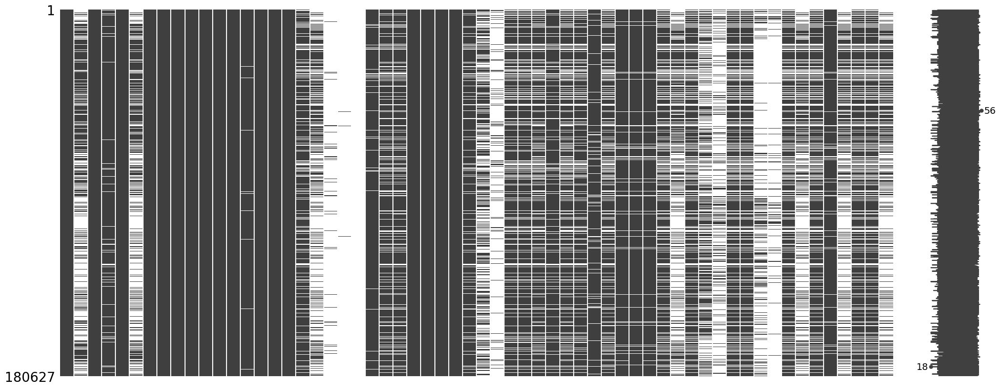

In [ ]:
# Empty spaces = missing values
msno.matrix(df1)

## Duplicate rows removal

In [ ]:
# Print duplicate rows
df1[df1.duplicated()]

,PID,CM_ID,GIS_ID,ST_NUM,ST_NAME,UNIT_NUM,CITY,ZIP_CODE,BLDG_SEQ,NUM_BLDGS,LUC,LU,LU_DESC,BLDG_TYPE,OWN_OCC,OWNER,OWNER MAIL ADDRESS,RES_FLOOR,CD_FLOOR,RES_UNITS,COM_UNITS,RC_UNITS,LAND_SF,GROSS_AREA,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YR_BUILT,YR_REMODEL,STRUCTURE_CLASS,ROOF_STRUCTURE,ROOF_COVER,INT_WALL,EXT_FNISHED,INT_COND,EXT_COND,OVERALL_COND,BED_RMS,FULL_BTH,HLF_BTH,KITCHENS,TT_RMS,BDRM_COND,BTHRM_STYLE1,BTHRM_STYLE2,BTHRM_STYLE3,KITCHEN_TYPE,KITCHEN_STYLE1,KITCHEN_STYLE2,KITCHEN_STYLE3,HEAT_TYPE,HEAT_FUEL,AC_TYPE,FIREPLACES,ORIENTATION,NUM_PARKING,PROP_VIEW,CORNER_UNIT
115301,1603979000,1603979000,1603979000,10,CHICKATAWBUT ST,NaN,DORCHESTER,02122,1,2.0,995,CM,CONDO MAIN,DK - Decker,N,10 CHICKATAWBUT STREET CONDOMINIUM TRUST,"10 CHICKATAWBUT ST, DORCHESTER, MA 02122",3.0,NaN,3.0,NaN,NaN,6025.0,NaN,NaN,0.0,0.0,0.0,0.0,1905,<NA>,NaN,F - Flat,R - Rubber Roof,NaN,C - Cement Board,NaN,A - Average,A - Average,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A - Average,NaN


In [ ]:
# Remove duplicate rows
df2 = df1.drop_duplicates(ignore_index = True).copy()

# New dataframe dimensions
df2.shape

(180626, 60)

## Treatment of invalid values

In [ ]:
# Print rows - invalid years
df2[(df2.YR_BUILT > 2023) | (df2.YR_BUILT < 0)]

,PID,CM_ID,GIS_ID,ST_NUM,ST_NAME,UNIT_NUM,CITY,ZIP_CODE,BLDG_SEQ,NUM_BLDGS,LUC,LU,LU_DESC,BLDG_TYPE,OWN_OCC,OWNER,OWNER MAIL ADDRESS,RES_FLOOR,CD_FLOOR,RES_UNITS,COM_UNITS,RC_UNITS,LAND_SF,GROSS_AREA,LIVING_AREA,LAND_VALUE,BLDG_VALUE,TOTAL_VALUE,GROSS_TAX,YR_BUILT,YR_REMODEL,STRUCTURE_CLASS,ROOF_STRUCTURE,ROOF_COVER,INT_WALL,EXT_FNISHED,INT_COND,EXT_COND,OVERALL_COND,BED_RMS,FULL_BTH,HLF_BTH,KITCHENS,TT_RMS,BDRM_COND,BTHRM_STYLE1,BTHRM_STYLE2,BTHRM_STYLE3,KITCHEN_TYPE,KITCHEN_STYLE1,KITCHEN_STYLE2,KITCHEN_STYLE3,HEAT_TYPE,HEAT_FUEL,AC_TYPE,FIREPLACES,ORIENTATION,NUM_PARKING,PROP_VIEW,CORNER_UNIT
118800,1701545008,1701545000,1701545000,36,COLONIAL AV,38-2,DORCHESTER,02124,1,1.0,102,CD,RESIDENTIAL CONDO,FS - Free Standing,Y,TAUB DANIEL G,"38 COLONIAL AV, Unit 38-2, DORCHESTER, MA 02124",2.0,3.0,NaN,NaN,NaN,1338.0,1338.0,1338.0,0.0,633000.0,633000.0,6798.4172,20198,2020,NaN,F - Flat,R - Rubber Roof,N - Normal,C - Cement Board,E - Excellent,E - Excellent,A - Average,3.0,2.0,0.0,1.0,6.0,A - Average,M - Modern,M - Modern,NaN,O - One Person,M - Modern,NaN,NaN,F - Forced Hot Air,I - Indiv. Cntrl,C - Central AC,0.0,T - Through,1.0,A - Average,N - No


In [ ]:
# Replace invalid years
df2['YR_BUILT'] = df2['YR_BUILT'].replace(20198, 2018)

## Distribution of properties by zip code - Bar chart

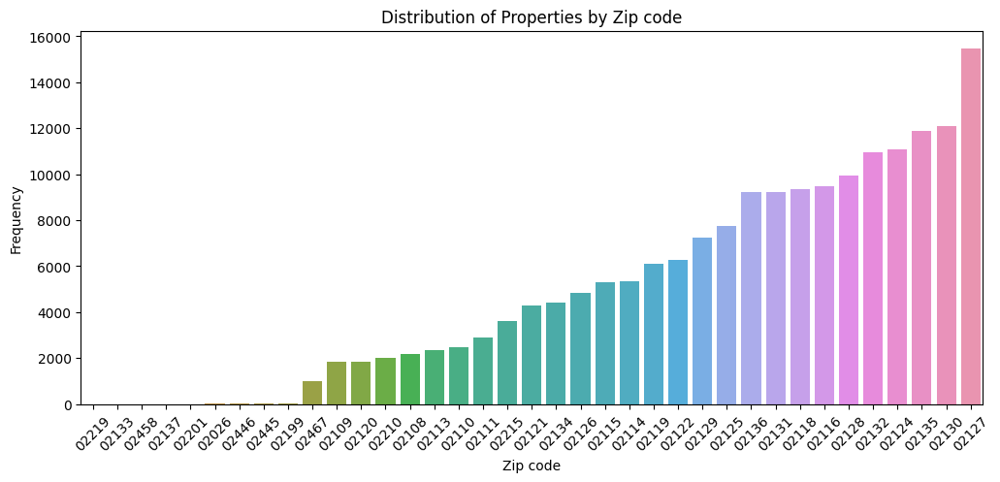

In [ ]:
# Count of rows (PID) by zip code
df2_1 = df2.groupby(by = ["ZIP_CODE"]).agg({"PID": "count"}).sort_values(by = "PID")

# Figure size
plt.figure(figsize = (12, 5))

# Bar chart
fig = sns.barplot(
    data = df2_1,
    x = df2_1.index,
    y = "PID")

# Chart labels
plt.xlabel("Zip code")
plt.xticks(rotation = 45)
plt.ylabel("Frequency")
plt.title("Distribution of Properties by Zip code")

# Display chart
plt.show(fig)

## Treatment of invalid/irrelevant zip codes

Load GeoJSON data for zip-code-level geographical features of Boston

(Data Source: https://data.boston.gov/dataset/zip-codes)

In [ ]:
# File path
geoJsonPath = "<path_to_file - ZIP_Codes_Boston.geojson>"

# Load data
with open(geoJsonPath) as f:
  zipcodes = json.load(f)
dfGeo = gpd.read_file(geoJsonPath)

In [ ]:
# GeoJSON dataframe dimensions
dfGeo.shape

(43, 5)

In [ ]:
# Top 5 rows
dfGeo.head()

,OBJECTID,ZIP5,ShapeSTArea,ShapeSTLength,geometry
0,1,02134,3.721936e+07,40794.182396,"POLYGON ((-71.12340 42.36421, -71.12345 42.364..."
1,2,02125,6.476052e+07,62224.521440,"POLYGON ((-71.04541 42.32381, -71.04579 42.323..."
2,3,02110,6.637284e+06,18358.213496,"POLYGON ((-71.05109 42.36418, -71.05109 42.364..."
3,4,02118,3.116158e+07,32353.407618,"POLYGON ((-71.06315 42.34689, -71.06433 42.347..."
4,5,02126,6.078585e+07,45488.394711,"POLYGON ((-71.09670 42.29095, -71.09692 42.290..."


In [ ]:
# All unique zip codes
# Property assessment dataframe
dfUniqueZipCodes = df2.ZIP_CODE.unique()
dfUniqueZipCodes = dfUniqueZipCodes[~pd.isnull(dfUniqueZipCodes)]

# Boston zip codes
# GeoJSON dataframe
BostonZipCodes = dfGeo.ZIP5.tolist()

# Zip codes from dataframe also in GeoJSON
# (Valid)
validUniqueZipCodesBool = [x in BostonZipCodes for x in dfUniqueZipCodes]
validUniqueZipCodes = dfUniqueZipCodes[validUniqueZipCodesBool]
validUniqueZipCodes = validUniqueZipCodes.tolist()

# Zip codes from dataframe not in GeoJSON
# (Invalid)
invalidUniqueZipCodesBool = ~np.array(validUniqueZipCodesBool)
invalidUniqueZipCodes = dfUniqueZipCodes[invalidUniqueZipCodesBool]
invalidUniqueZipCodes = invalidUniqueZipCodes.tolist()

# Print invalid zip codes
invalidUniqueZipCodes

['02201', '02133', '02219', '02137', '02446', '02445', '02458']

In [ ]:
# Print rows with invalid zip codes

validDfZipCodesBool = [x in validUniqueZipCodes for x in df2.ZIP_CODE]
invalidDfZipCodesBool = ~np.array(validDfZipCodesBool)

columns = ["PID", "ST_NUM", "ST_NAME", "UNIT_NUM", "CITY", "ZIP_CODE"]
df2.loc[invalidDfZipCodesBool, columns]

,PID,ST_NUM,ST_NAME,UNIT_NUM,CITY,ZIP_CODE
22500,0302951010,306,CONGRESS ST,NaN,BOSTON,02201
27969,0304630010,350,Washington ST,NaN,BOSTON,02201
27970,0304630020,350,Washington ST,NaN,BOSTON,02201
44971,0501615000,24,BEACON ST,NaN,BOSTON,02133
82675,0903737450,2503,WASHINGTON ST,NaN,ROXBURY,02219
118662,1701421010,49,NORFOLK ST,NaN,BOSTON,NaN
134509,1809724000,215,NEPONSET VALLEY PW,NaN,READVILLE,02137
137600,1812152331,1,WESTINGHOUSE PZ,PS 72,HYDE PARK,NaN
138822,1812972030,50,Industrial DR,NaN,READVILLE,02137
164545,2100640044,9,GARDNER ST,PS 8,NaN,NaN


Description of invalid/irrelevant zip codes:

* 02201 - City Hall - Remove (Outlier)
* 02133 - Massachusetts State House - Remove (Outlier)
* 02446 - Brookline - Remove (Not a part of Boston)
* 02445 - Brookline - Remove (Not a part of Boston)
* 02458 - Newton - Remove (Not a part of Boston)
* 02137 - Invalid, replace with 02136 (Verified on Google Maps)
* 02219 - Invalid, replace with 02119 (Verified on Google Maps)
* Empty - Replace (From Google Maps)

In [ ]:
# Replace invalid zip codes

df2['ZIP_CODE'] = df2['ZIP_CODE'].replace(["02219", "02137"], ["02119", "02136"])

df2.at[118662, "ZIP_CODE"] = "02124"
df2.at[137600, "ZIP_CODE"] = "02136"
df2.at[164545, "ZIP_CODE"] = "02134"

In [ ]:
# Other identified irrelevant zip codes
otherIrrelevantZipCodes = ["02199", "02026"]

* 02199 - Prudential Center - Remove (Outlier)
* 02026 - Dedham - Remove (Not a part of Boston)

In [ ]:
# Updated list of irrelevant zip codes

irrelevantZipCodes = invalidUniqueZipCodes + otherIrrelevantZipCodes
irrelevantZipCodes.remove("02137")
irrelevantZipCodes.remove("02219")

irrelevantZipCodes

['02201', '02133', '02446', '02445', '02458', '02199', '02026']

In [ ]:
# Remove rows with invalid/irrelevant zip codes

irrelevantDfZipCodesBool = [x in irrelevantZipCodes for x in df2.ZIP_CODE]
relevantDfZipCodesBool = ~np.array(irrelevantDfZipCodesBool)

df3 = df2[relevantDfZipCodesBool].reset_index().copy()

# New dataframe dimensions
df3.shape

(180555, 61)

## Maps (Residential Properties)

In [ ]:
%%capture --no-stdout

# Approximate centroids of zip code polygons for labeling
dfGeo["LAT"] = dfGeo["geometry"].centroid.y
dfGeo["LONG"] = dfGeo["geometry"].centroid.x

In [ ]:
# Top 5 rows
dfGeo.head()

,OBJECTID,ZIP5,ShapeSTArea,ShapeSTLength,geometry,LAT,LONG
0,1,02134,3.721936e+07,40794.182396,"POLYGON ((-71.12340 42.36421, -71.12345 42.364...",42.357950,-71.129902
1,2,02125,6.476052e+07,62224.521440,"POLYGON ((-71.04541 42.32381, -71.04579 42.323...",42.315922,-71.055840
2,3,02110,6.637284e+06,18358.213496,"POLYGON ((-71.05109 42.36418, -71.05109 42.364...",42.357930,-71.052432
3,4,02118,3.116158e+07,32353.407618,"POLYGON ((-71.06315 42.34689, -71.06433 42.347...",42.338124,-71.070600
4,5,02126,6.078585e+07,45488.394711,"POLYGON ((-71.09670 42.29095, -71.09692 42.290...",42.274454,-71.094193


In [ ]:
# Customization of BindColormap class in Folium library
# Sources: GitHub, StackOverflow

from branca.element import MacroElement
from jinja2 import Template

# Custom Class for Binding Choropleth and Custom Legend
class BindColormap(MacroElement):
    """Binds a colormap to a given layer.

    Parameters
    ----------
    colormap : branca.colormap.ColorMap
        The colormap to bind.
    """
    def __init__(self, layer, colormap):
        super(BindColormap, self).__init__()
        self.layer = layer
        self.colormap = colormap
        self._template = Template(u"""
        {% macro script(this, kwargs) %}
            {{this.colormap.get_name()}}.svg[0][0].style.display = 'block';
            {{this._parent.get_name()}}.on('layeradd', function (eventLayer) {
                if (eventLayer.layer == {{this.layer.get_name()}}) {
                    {{this.colormap.get_name()}}.svg[0][0].style.display = 'block';
                }});
            {{this._parent.get_name()}}.on('layerremove', function (eventLayer) {
                if (eventLayer.layer == {{this.layer.get_name()}}) {
                    {{this.colormap.get_name()}}.svg[0][0].style.display = 'none';
                }});
        {% endmacro %}
        """)

In [ ]:
# Function to create folium map

def createFoliumMap(layer):

  # Create Boston map
  mapBoston = folium.Map(
      location = [42.312050, -71.060186],
      zoom_start = 12,
      width = 1000,
      height = 750,
      tiles = None)

  # Add base layer
  folium.TileLayer(
      tiles = "OpenStreetMap",
      min_zoom = 12,
      overlay = False,
      control = False
      ).add_to(mapBoston)

  # Add zip code labels at centroids
  for i in range(0, len(dfGeo)):
    label = f'<div style = "font-size: 8pt"> <b>{dfGeo.loc[i, "ZIP5"]}</b> </div>'
    folium.Marker(
        location = [
            dfGeo.loc[i, "LAT"],
            dfGeo.loc[i, "LONG"]],
        icon = folium.DivIcon(
            html = label)
        ).add_to(mapBoston)

  # Land use type
  landUseTypes = {
      "R1": "Residential 1-family",
      "R2": "Residential 2-family",
      "R3": "Residential 3-family",
      "R4": "Residential 4-family"}

  # Feature(layer ID), aggregation function, label
  mapLayers = {
      "Count of Properties": ["PID", "count", ": "],
      "Gross Area": ["GROSS_AREA", "median", ": Median "],
      "Year Built": ["YR_BUILT", "median", ": Median "],
      "Land Value": ["LAND_VALUE", "median", ": Median "]}

  # Add all layers to map
  for useType in landUseTypes.keys():

    layedID = mapLayers[layer][0]
    layerAggBy = mapLayers[layer][1]

    df = (df3
          .loc[df3.LU == useType]
          .groupby(by = ["ZIP_CODE"])
          .agg(newAgg = (layedID, layerAggBy))
          .reset_index(inplace = False)
          ).copy()

    label = landUseTypes[useType] + mapLayers[layer][2] + layer

    choroplethLayer = folium.Choropleth(
        name = label,
        data = df,
        columns = ["ZIP_CODE", "newAgg"],
        geo_data = zipcodes,
        key_on = "properties.ZIP5",
        fill_color = "BuGn",
        fill_opacity = 0.8,
        line_opacity = 0.5,
        nan_fill_opacity = 0.4,
        nan_fill_color = "red",
        legend_name = label,
        control = True,
        overlay = False)

    colorScale = choroplethLayer.color_scale

    for child in choroplethLayer._children:
      if child.startswith("color_map"):
        del choroplethLayer._children[child]

    mapBoston.add_child(colorScale)

    mapBoston.add_child(choroplethLayer)

    mapBoston.add_child(
        BindColormap(
            choroplethLayer,
            colorScale))

  folium.LayerControl(
      collapsed = False,
  ).add_to(mapBoston)

  return mapBoston

### Count of Residential Properties by Zip Code

In [ ]:
createFoliumMap("Count of Properties")

### Residential Properties - Median Gross Area by Zip Code

In [ ]:
createFoliumMap("Gross Area")

### Residential Properties - Median Year Built by Zip Code

In [ ]:
createFoliumMap("Year Built")

### Residential Properties - Median Land Value by Zip Code

In [ ]:
createFoliumMap("Land Value")

## Exploratory Analysis

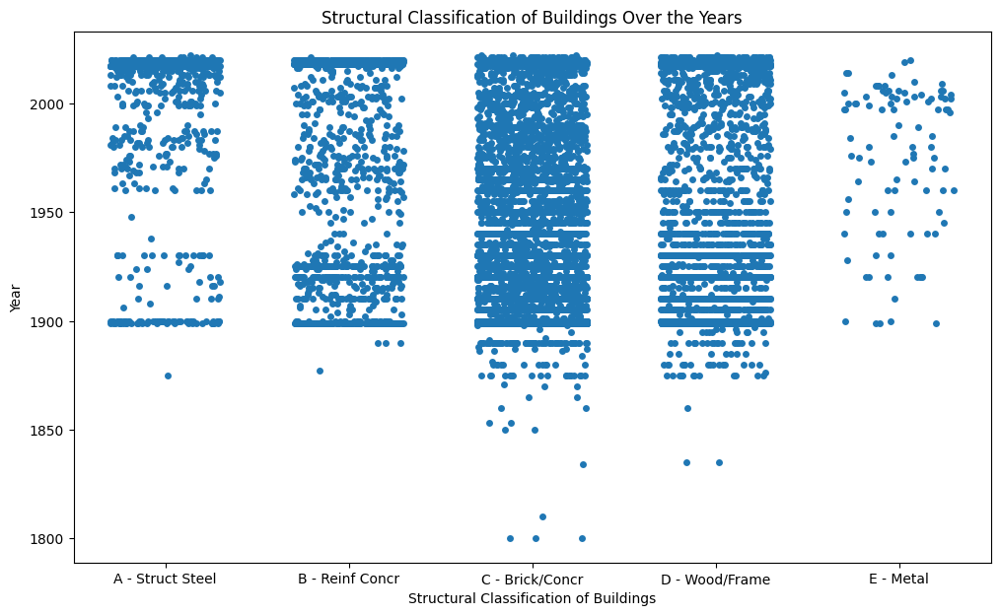

In [ ]:
# Structural classification of buildings over the years

# Figure size
plt.figure(figsize = (12, 7))

# Chart
fig = sns.stripplot(
    data = df3,
    x = "STRUCTURE_CLASS",
    y = "YR_BUILT",
    order = [
        "A - Struct Steel",
        "B - Reinf Concr",
        "C - Brick/Concr",
        "D - Wood/Frame",
        "E - Metal"],
    jitter = 0.3)

# Chart labels
plt.xlabel("Structural Classification of Buildings")
plt.ylabel("Year")
plt.title("Structural Classification of Buildings Over the Years")

# Display chart
plt.show(fig)


Number of Properties Owned by CITY OF BOSTON: 1961 (Excluded from Chart)



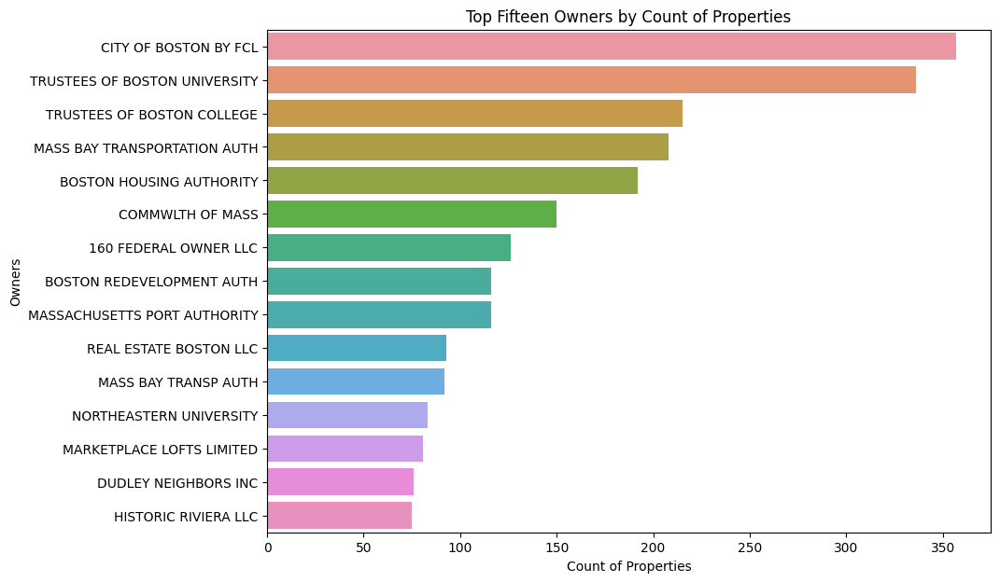

In [ ]:
# Top fifteen owners by property count

# Top owners
topOwners = df3.OWNER.value_counts()

# Treat inconsistent values
topOwners["COMMONWEALTH OF MASS"] += topOwners["COMMWLTH OF MASS"]
topOwners["MASS BAY TRANSPORTATION AUTH"] += topOwners["MASS BAY TRANSP AUTH"]

# Sort values
topOwners.sort_values(
    ascending = False,
    inplace = True)

# Figure size
plt.figure(figsize = (10, 7))

# Horizontal bar chart
fig = sns.barplot(
    y = topOwners[2:17].index,
    x = topOwners[2:17],
    orient = "h")

# Chart labels
plt.xlabel("Count of Properties")
plt.ylabel("Owners")
plt.title("Top Fifteen Owners by Count of Properties")


# Properties owned by CITY OF BOSTON
# (Excluded from chart for enhanced scaling)
print(f"\nNumber of Properties Owned by CITY OF BOSTON: {topOwners[0]} (Excluded from Chart)\n")

# Display chart
plt.show(fig)